In [ ]:
!pip install -U imbalanced-learn

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
default = plt.rcParams.copy()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = "/content/drive/MyDrive/Personal/Datasets/PIT_creditcard.csv"
df = pd.read_csv(file_path)

In [ ]:
print(f"Dataset:\n Rows: {df.shape[0]}\n Columns: {df.shape[1]}")

Dataset:
 Rows: 284807
 Columns: 31


In [ ]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


Fraudulent Transactions: 492 	0.173%
Valid Transactions: 284315 	99.827%


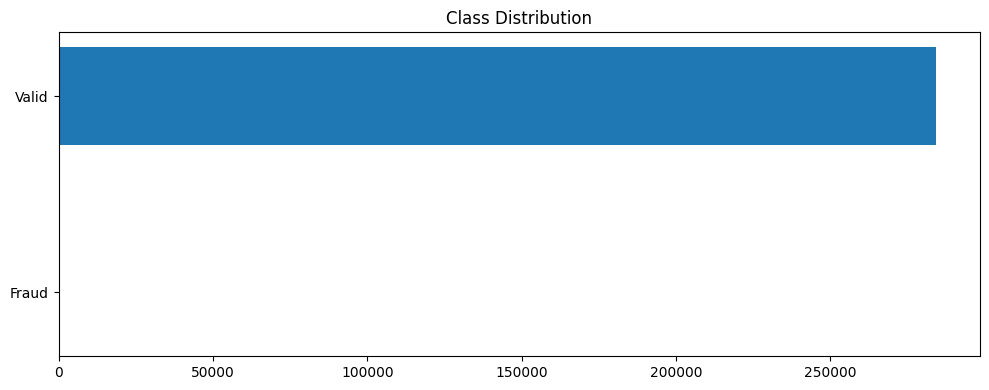

In [ ]:
fig, ax = plt.subplots(figsize=(10,4))
labels = ['Fraud', 'Valid']
values = [df.Class.value_counts()[1], df.Class.value_counts()[0]]
plt.barh(labels, values, height=0.5)
plt.title('Class Distribution')
plt.tight_layout()

print(f"Fraudulent Transactions: {values[0]} \t{values[0]/df.shape[0]*100:.3f}%")
print(f"Valid Transactions: {values[1]} \t{values[1]/df.shape[0]*100:.3f}%")

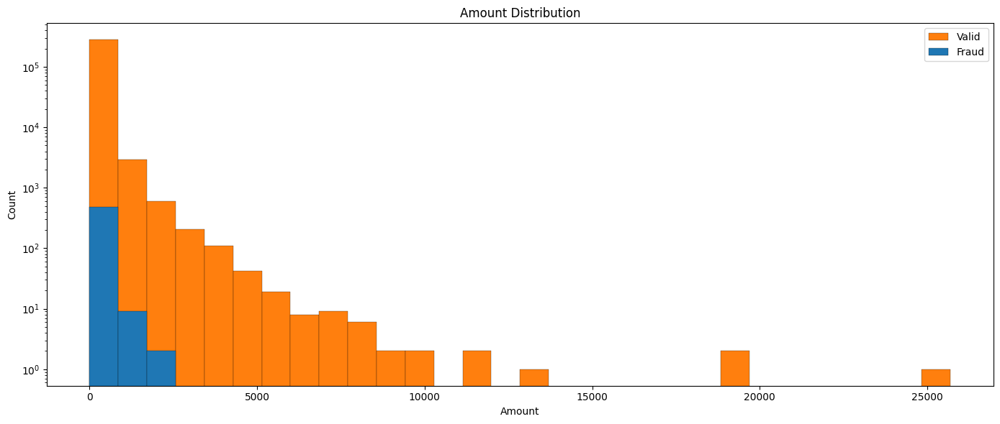

In [ ]:
fig, ax = plt.subplots(figsize=(14,6))
sns.histplot(data=df,x="Amount", bins=30, hue=df.Class, ax=ax,alpha=1.0,hue_order=[1,0],linewidth=0.2)
plt.title('Amount Distribution')
legend=["Valid","Fraud"]
plt.legend(legend)
plt.yscale("log") # Permite visualizar la data de forma mas clara
plt.tight_layout()

Total time:
 172792 seconds
 48.00 hours


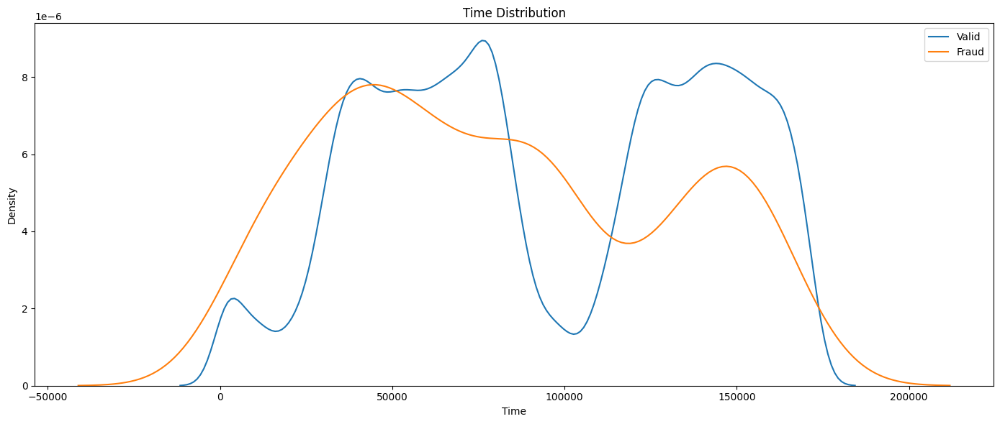

In [ ]:
print(f"Total time:\n {df.Time.max():.0f} seconds\n {df.Time.max()/3600:.2f} hours")

fig, ax = plt.subplots(figsize=(14,6))
sns.kdeplot(df.Time.loc[df.Class == 0], ax=ax)
sns.kdeplot(df.Time.loc[df.Class == 1], ax=ax)
plt.title('Time Distribution')
plt.legend(["Valid","Fraud"])
plt.tight_layout()

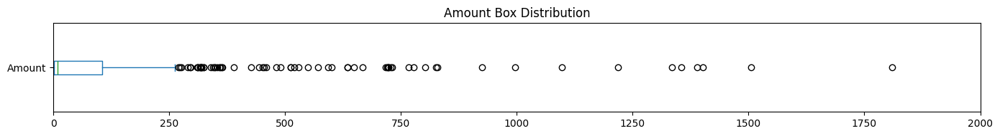

In [ ]:
# grafica de caja para observar la distribucion y cantidad de transacciones fraudulentas
fig, ax =plt.subplots(figsize=(14,2))
target = df.loc[df.Class == 1].Amount
target.plot(kind="box", vert=False)
ax.set_xlim(0,2000)
plt.title('Amount Box Distribution')
plt.tight_layout()

In [ ]:
print(target.describe())

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64


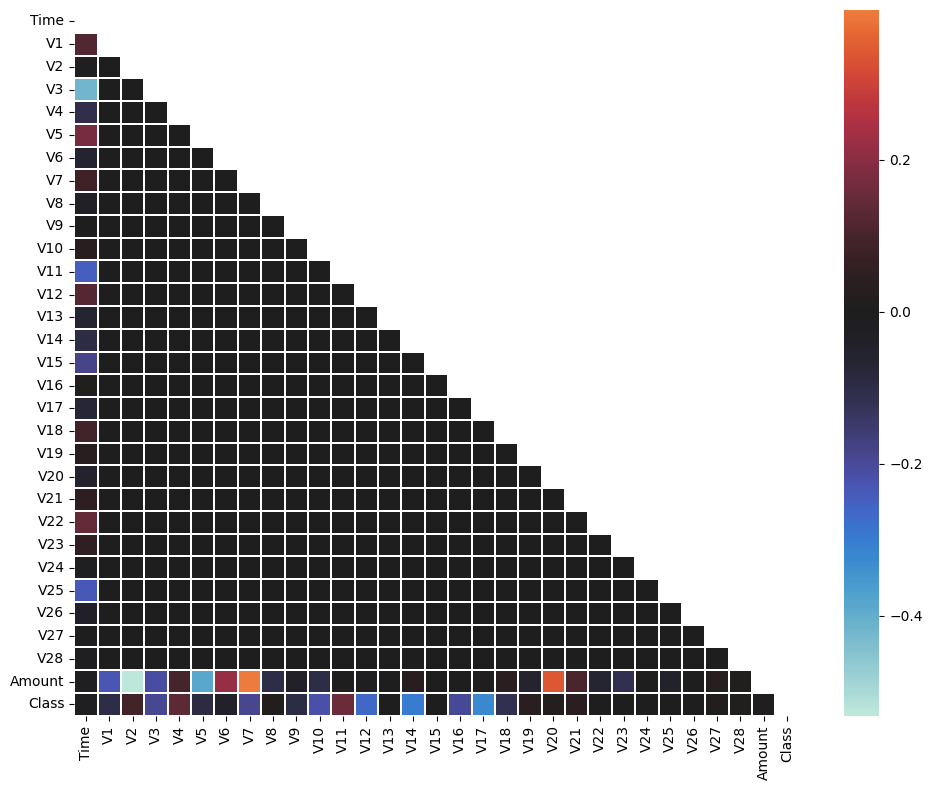

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
heat_df = df.corr()
sns.color_palette("magma", as_cmap=True)
mask = np.triu(np.ones_like(heat_df, dtype=bool))
sns.heatmap(heat_df, mask=mask, ax=ax, center=0, linewidths=0.1, annot=False)

plt.tight_layout()

In [ ]:
# Normalization
df.Time = (df.Time - df.Time.mean())/df.Time.std()
df.Amount = (df.Amount - df.Amount.mean())/df.Amount.std()

In [ ]:
X = df.drop("Class", axis=1)
y = df.Class

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

scaler = StandardScaler()
scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

X_train.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
223361,1.022111,1.955041,-0.380783,-0.315013,0.330155,-0.509374,-0.086197,-0.627978,0.035994,1.054560,...,-0.125390,0.238197,0.968305,0.053208,-0.278602,-0.044999,-0.216780,0.045168,-0.047145,-0.313288
165061,0.470836,-0.400975,-0.626943,1.555339,-2.017772,-0.107769,0.168310,0.017959,-0.401619,0.040378,...,-0.470372,-0.153485,0.421703,0.113442,-1.004095,-1.176695,0.361924,-0.370469,-0.144792,-0.169717
238186,1.152943,0.072509,0.820566,-0.561351,-0.709897,1.080399,-0.359429,0.787858,0.117276,-0.131275,...,0.012227,-0.314638,-0.872959,0.083391,0.148178,-0.431459,0.119690,0.206395,0.070288,-0.305292
150562,-0.024087,-0.535045,1.014587,1.750679,2.769390,0.500089,1.002270,0.847902,-0.081323,0.371579,...,-0.253757,0.063525,0.443431,-0.072754,0.448192,-0.655203,-0.181038,-0.093013,-0.064931,0.116306
138452,-0.256040,-4.026938,1.897371,-0.429786,-0.029571,-0.855751,-0.480406,-0.435632,1.313760,0.536044,...,-0.012320,-0.480691,-0.230369,0.250717,0.066399,0.470787,0.245335,0.286904,-0.322672,-0.250238


In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100,random_state=0)
model.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print(f"Accuracy: {accuracy_score(y_test,y_pred)}")

Accuracy: 0.9995786664794073


In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.96      0.79      0.87        98

    accuracy                           1.00     56962
   macro avg       0.98      0.89      0.93     56962
weighted avg       1.00      1.00      1.00     56962



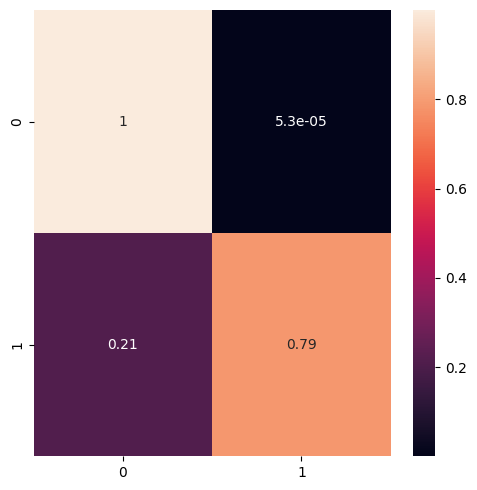

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

norm = [i for i in confusion_matrix(y_test,y_pred)]
norm[0] = norm[0]/norm[0].sum()
norm[1] = norm[1]/norm[1].sum()

sns.color_palette("magma", as_cmap=True)
sns.heatmap(data=norm, annot=True, ax=ax)
plt.tight_layout()

# Detecta todos los que no son y el 79% de los que si son fraude

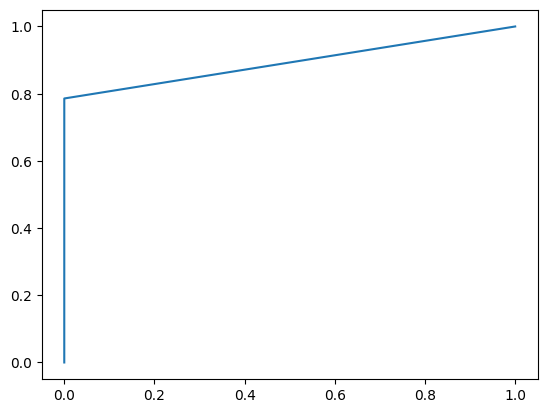

In [ ]:
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, y_pred)
plt.plot(fpr,tpr)
plt.show()

# al empzar tan cerca del 1 indica que es un buen clasificador

In [ ]:
from sklearn.metrics import roc_auc_score, PrecisionRecallDisplay, auc, average_precision_score
print(f"Roc_auc Score: {roc_auc_score(y_test,y_pred)}")

Roc_auc Score: 0.8928307641289491


Average Precision Score: 0.7566186668305186


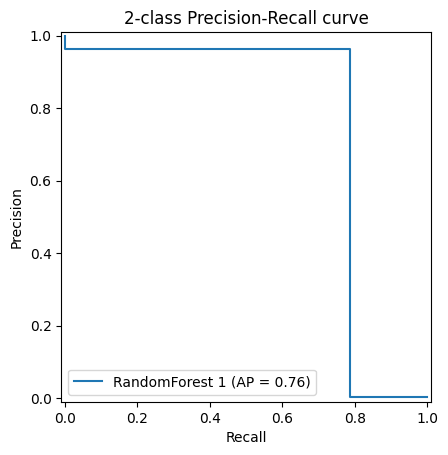

In [ ]:
display = PrecisionRecallDisplay.from_predictions(y_test,y_pred,name="RandomForest 1")
_ = display.ax_.set_title("2-class Precision-Recall curve")
_ = display.ax_.set_xlabel("Recall")
_ = display.ax_.set_ylabel("Precision")
print(f"Average Precision Score: {average_precision_score(y_test,y_pred)}")

In [ ]:
'''Manejando el Desbalance'''
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

over = SMOTE(sampling_strategy=0.1,random_state=0)
under = RandomUnderSampler(sampling_strategy=0.5,random_state=0)
steps_ou = [('over',over),('under',under)]
steps_u = [('under',under)]
steps_uo = [('under',under),('over',over)]
steps_o = [('over',over)]
pipeline_ou = Pipeline(steps=steps_ou)
pipeline_u = Pipeline(steps=steps_u)
pipeline_o = Pipeline(steps=steps_o)
pipeline_uo = Pipeline(steps=steps_uo)

In [ ]:
print(f"Valid: {y.value_counts()[0]}\nFraud: {y.value_counts()[1]}")

Valid: 284315
Fraud: 492


In [ ]:
# Transform unbalanced data

X_train_ou, y_train_ou = pipeline_ou.fit_resample(X_train,y_train)
X_train_u, y_train_u = pipeline_u.fit_resample(X_train,y_train)
X_train_o, y_train_o = pipeline_o.fit_resample(X_train,y_train)
# try to decresed quantity of minority class, no posible balance
# X_train_uo, y_train_uo = pipeline_uo.fit_resample(X_train,y_train)

In [ ]:
print(f"Valid: {y.value_counts()[0]}\nFraud: {y.value_counts()[1]}")
print(f"Valid_ou: {y_train_ou.value_counts()[0]}\nFraud_ou: {y_train_ou.value_counts()[1]}")
print(f"Valid_u: {y_train_u.value_counts()[0]}\nFraud_u: {y_train_u.value_counts()[1]}")
print(f"Valid_o: {y_train_o.value_counts()[0]}\nFraud_o: {y_train_o.value_counts()[1]}")

Valid: 284315
Fraud: 492
Valid_ou: 45490
Fraud_ou: 22745
Valid_u: 788
Fraud_u: 394
Valid_o: 227451
Fraud_o: 22745


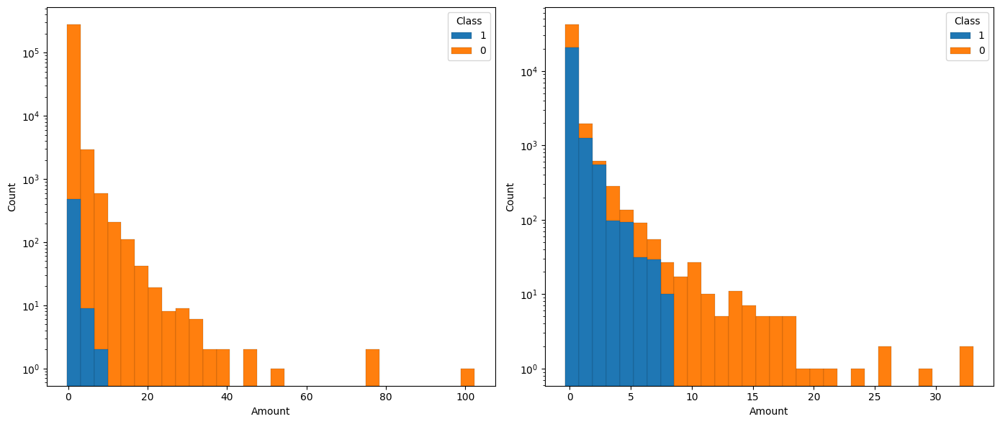

In [ ]:
fig, (ax1,ax2) = plt.subplots(figsize=(14,6),nrows=1,ncols=2)

new_df = X_train_ou.copy().merge(y_train_ou.rename('Class'),left_index=True,right_index=True)
sns.histplot(data=df,x="Amount", bins=30,hue=df.Class,ax=ax1,alpha=1.0,hue_order=[1,0],linewidth=0.1)
sns.histplot(data=new_df,x="Amount", bins=30,hue=new_df.Class,ax=ax2,alpha=1.0,hue_order=[1,0],linewidth=0.1)
ax1.set_yscale("log")
ax2.set_yscale("log")
plt.tight_layout()

# plt.savefig(fname="imbalance_comparison.svg")

In [ ]:
model_ou = RandomForestClassifier(n_estimators=100,random_state=0)
model_ou.fit(X_train_ou,y_train_ou)
model_u = RandomForestClassifier(n_estimators=100,random_state=0)
model_u.fit(X_train_u,y_train_u)
model_o = RandomForestClassifier(n_estimators=100,random_state=0)
model_o.fit(X_train_o,y_train_o)

RandomForestClassifier(random_state=0)

In [ ]:
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz

export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False,
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

In [ ]:
y_pred_ou = model_ou.predict(X_test)
y_pred_u = model_u.predict(X_test)
y_pred_o = model_o.predict(X_test)

In [ ]:
print(f"Accuracy: {accuracy_score(y_test,y_pred)}")
print(f"Accuracy_ou: {accuracy_score(y_test,y_pred_ou)}")
print(f"Accuracy_u: {accuracy_score(y_test,y_pred_u)}")
print(f"Accuracy_o: {accuracy_score(y_test,y_pred_o)}")

Accuracy: 0.9995786664794073
Accuracy_ou: 0.9993153330290369
Accuracy_u: 0.9916435518415786
Accuracy_o: 0.9995611109160493


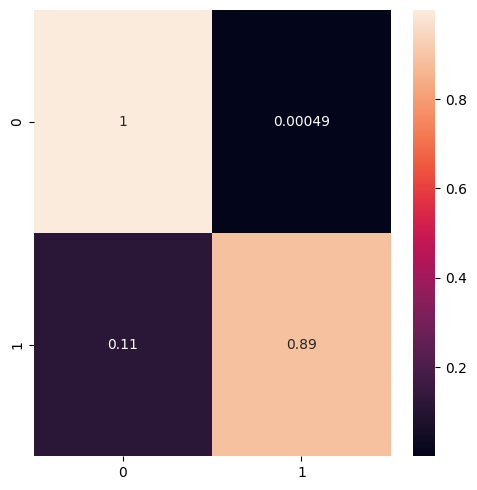

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

norm = [i for i in confusion_matrix(y_test,y_pred_ou)]
norm[0] = norm[0]/norm[0].sum()
norm[1] = norm[1]/norm[1].sum()

sns.color_palette("magma", as_cmap=True)
sns.heatmap(data=norm, annot=True, ax=ax)
plt.tight_layout()

In [ ]:
print(f"Roc_auc Score: {roc_auc_score(y_test,y_pred)}")
print(f"Roc_auc Score_ou: {roc_auc_score(y_test,y_pred_ou)}")
print(f"Roc_auc Score_u: {roc_auc_score(y_test,y_pred_u)}")
print(f"Roc_auc Score_o: {roc_auc_score(y_test,y_pred_o)}")

Roc_auc Score: 0.8928307641289491
Roc_auc Score_ou: 0.943631349557268
Roc_auc Score_u: 0.9499753439642599
Roc_auc Score_o: 0.9182882107541948
